In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
food_prod = pd.read_csv('C:/Users/Emmanuel Aminu/Downloads/hamoye fp/foodprod.csv')
food_supply = pd.read_csv('C:/Users/Emmanuel Aminu/Downloads/hamoye fp/Africa Food Supply.csv')

In [3]:
food_prod.head(25)

,Country,Item,Year,Value
0,Algeria,Wheat and products,2004,2731
1,Algeria,Wheat and products,2005,2415
2,Algeria,Wheat and products,2006,2688
3,Algeria,Wheat and products,2007,2319
4,Algeria,Wheat and products,2008,1111
5,Algeria,Wheat and products,2009,2953
6,Algeria,Wheat and products,2010,2605
7,Algeria,Wheat and products,2011,2555
8,Algeria,Wheat and products,2012,3432
9,Algeria,Wheat and products,2013,3299


In [4]:
food_supply.head()

,Country,Year,Value
0,Algeria,2004,2987
1,Algeria,2005,2958
2,Algeria,2006,3047
3,Algeria,2007,3041
4,Algeria,2008,3048


In [5]:
food_prod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23110 entries, 0 to 23109
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Country  23110 non-null  object
 1   Item     23110 non-null  object
 2   Year     23110 non-null  int64 
 3   Value    23110 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 722.3+ KB


In [6]:
food_supply.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 450 entries, 0 to 449
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Country  450 non-null    object
 1   Year     450 non-null    int64 
 2   Value    450 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 10.7+ KB


In [7]:
food_supply.isnull().sum()

Country    0
Year       0
Value      0
dtype: int64

In [8]:
food_prod.isnull().sum()

Country    0
Item       0
Year       0
Value      0
dtype: int64

In [9]:
food_prod.dtypes

Country    object
Item       object
Year        int64
Value       int64
dtype: object

In [10]:
# First walk with the African Food Productions

In [11]:

# no duplicated data

food_prod.duplicated().sum()

0

In [12]:
food_prod.describe()

,Year,Value
count,23110.000000,23110.000000
mean,2008.498269,327.785201
std,2.871740,1607.940343
min,2004.000000,0.000000
25%,2006.000000,3.000000
50%,2008.000000,18.000000
75%,2011.000000,108.000000
max,2013.000000,54000.000000


In [13]:
from datetime import datetime

food_prod['Year'] = pd.to_datetime(food_prod['Year'], format="%Y").dt.year


In [14]:
food_prod

,Country,Item,Year,Value
0,Algeria,Wheat and products,2004,2731
1,Algeria,Wheat and products,2005,2415
2,Algeria,Wheat and products,2006,2688
3,Algeria,Wheat and products,2007,2319
4,Algeria,Wheat and products,2008,1111
...,...,...,...,...
23105,Zimbabwe,Crustaceans,2009,0
23106,Zimbabwe,Crustaceans,2010,0
23107,Zimbabwe,Crustaceans,2011,0
23108,Zimbabwe,Crustaceans,2012,0


In [15]:
food_prod.dtypes

Country    object
Item       object
Year        int64
Value       int64
dtype: object

In [19]:
food_prod['Unit Mertic'] = 'KiloTon'


<h3> The Food_Prod has 4 features, which are important, the country, Items, Year and Value</h3>
<p> And the addition od Unit Metric to signifiy what type of Unit it is</p>
<p> We can begin to explore the data by group to get insights from the data</p>

In [20]:
fp = food_prod.groupby(['Country', 'Year'])
fp.first()

Item  Value Unit Mertic
Country  Year                                       
Algeria  2004  Wheat and products   2731     KiloTon
         2005  Wheat and products   2415     KiloTon
         2006  Wheat and products   2688     KiloTon
         2007  Wheat and products   2319     KiloTon
         2008  Wheat and products   1111     KiloTon
...                           ...    ...         ...
Zimbabwe 2009  Wheat and products     12     KiloTon
         2010  Wheat and products     18     KiloTon
         2011  Wheat and products     23     KiloTon
         2012  Wheat and products     20     KiloTon
         2013  Wheat and products     25     KiloTon

[450 rows x 3 columns]

In [21]:
fp['Country'].unique()

Country   Year
Algeria   2004     [Algeria]
          2005     [Algeria]
          2006     [Algeria]
          2007     [Algeria]
          2008     [Algeria]
                     ...    
Zimbabwe  2009    [Zimbabwe]
          2010    [Zimbabwe]
          2011    [Zimbabwe]
          2012    [Zimbabwe]
          2013    [Zimbabwe]
Name: Country, Length: 450, dtype: object

In [22]:
import plotly.express as px

<p> This figure below shows the highest outlier, accord during the year 2012, and the minumum number of tons of food supplied, was in the year 2007</p>

In [116]:
figs = px.box(data_frame = food_supply, x='Year', y = 'Value', color='Year', title= 'Box Plot for Food Supply Per Year')
figs.show()

<p> This figure below shows that the most producted tons of food is the Cassava Products, found in the country Nigeria</p>

In [24]:
px.line(food_prod, x = 'Country', y = 'Value', color ='Item', title = 'Food Production Trend for each Countries')

<p> This figure below shows at which year, and which the country has the highest Metric Tons in Food Production</p>
</br>
<p> and we can see that the country with Nigeria produces more tons of food than others</p>

In [25]:
px.line(food_prod, x = 'Year', y = 'Value', color='Country', title = 'Food Production Line Trend for each year')

<p> Nigeria has the Hightest Trend in food production</p>

In [26]:
fig = px.bar(food_prod, 
             x ="Country", 
             y ="Value",
             color ='Item',
             animation_frame ='Year',
             hover_name ='Country',
             title = 'The Food Production Trend in Animation')
fig.show()

<p> With the Figure above it shows the Country which produces more food</p>

</br>

<p> Also shows the progression  of Food production, from year 2004 to year 2013 </p>
</br>
<p> The top 5 countries with the highest food production is:</p>
    <li>
    <ol> Nigeria </ol>
    <ol> Egypt </ol>
    <ol> South Africa </ol>
    <ol> United Republic </ol>
    <ol> Ghana </ol>
    </li>

<p> We can see that the food product <b> Sugar Cane is more produced in South Africa </b></p>
<p> The country <b>Nigeria</b> produces for <b>Yam</b> produces than other countries in Africa, since 2004 to 2013</p>



In [27]:
d = {'Food Item': food_prod['Item'].values,
    'Value': food_prod['Value'].values}

df_d = pd.DataFrame(d)

df_d.index = food_prod['Year']
df_d.head()

,Food Item,Value
Year,,
2004,Wheat and products,2731
2005,Wheat and products,2415
2006,Wheat and products,2688
2007,Wheat and products,2319
2008,Wheat and products,1111


In [28]:
# Bootstrap Plot

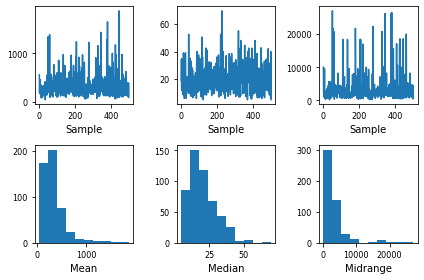

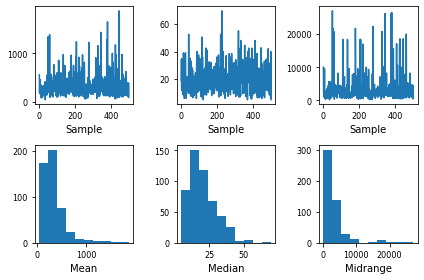

In [29]:
pd.plotting.bootstrap_plot(food_prod['Value'])

In [30]:
# Scatter Matrix

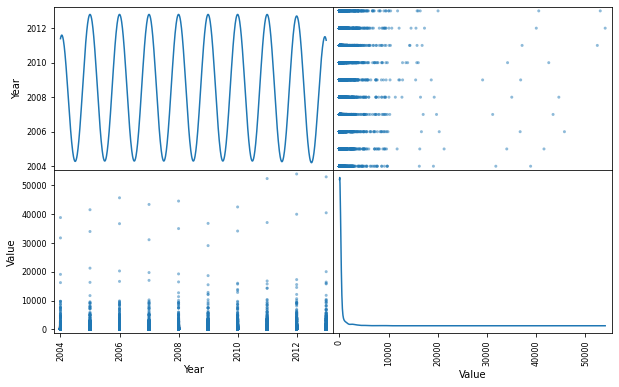

In [31]:
from pandas.plotting import scatter_matrix
scatter_matrix(food_prod, alpha=0.5, figsize=(10, 6), diagonal='kde');

In [32]:
# HEX PLOT

In [33]:
px.line(food_prod, x='Item', y= 'Value')

In [34]:
fig = px.pie(food_prod, values="Value", names="Item")
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

<p>List of Top Produce Food Items<p>
</br>
<p>a) Cassava and Products</p>
</br>
<p>b) Sugar Cane</p>
</br>
<p>c) Maiza and Products</p>
</br>
<p>d) Yams</p>
</br>
<p>e) Vegitables, Other</p>

In [118]:
fig = px.pie(food_prod, values="Value", names="Country", title = "Pie Plot of Food Value Production per Country")
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

The Top Countries with the Number of Food Production are:
</br>
    <ol> Nigeria </ol>
    <ol> Egypt </ol>
    <ol> South Africa </ol>
    <ol> Ethiopia </ol>
    <ol> United Republic </ol>

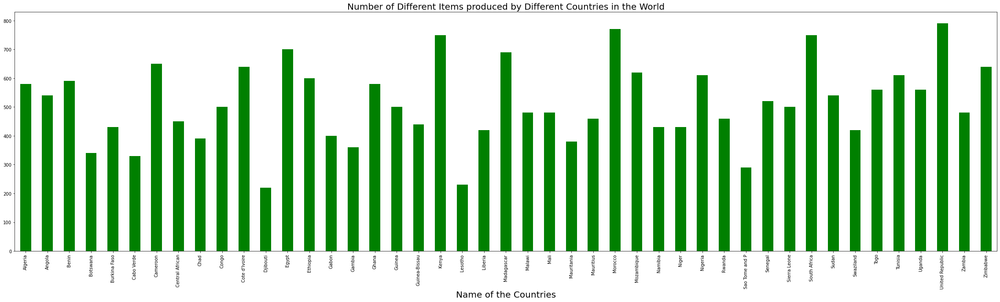

In [36]:
food_prod['Country'].value_counts().sort_index().plot.bar(figsize = (40, 10), color = 'green')
plt.title('Number of Different Items produced by Different Countries in the World', fontsize = 20)
plt.xlabel('Name of the Countries', fontsize = 20)
plt.show()

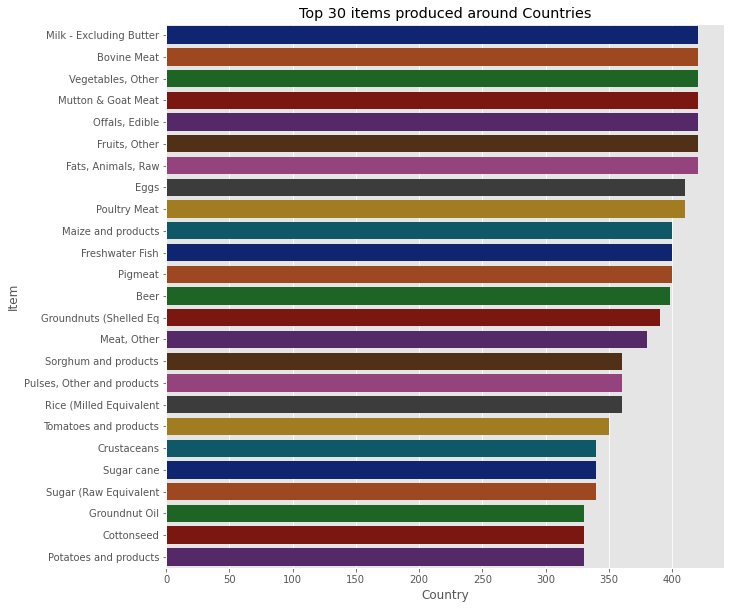

In [37]:
# setting the style to be ggplot
plt.style.use("ggplot")


items = pd.DataFrame(food_prod.groupby("Item")["Country"].agg("count").sort_values(ascending=False))[:25]

# plotting
plt.rcParams['figure.figsize'] = (10, 10)
#plt.gcf().subplots_adjust(left = .3)
sns.barplot(x = items.Country, y = items.index, data = items, palette = 'dark')
plt.gca().set_title("Top 30 items produced around Countries")
plt.show()


The figure above shows thr Food Items that are mostly popular in these countries

In [38]:
countries = list(food_supply['Country'].unique())
years = list(food_supply['Year'].unique())
items = list


In [39]:
fig = px.histogram(food_prod, x='Year', y= 'Value', color='Country')
fig.show()

From the Figure above we see that in Food Production, the increase in growth of Food from year 2004 to 2013.

In [40]:
means = list(food_prod['Year'].iloc[:].unique())
means

[2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013]

In [112]:
items_of_food = list(food_prod['Item'].iloc[:].unique())
items_of_food

['Wheat and products',
 'Rice (Milled Equivalent',
 'Barley and products',
 'Maize and products',
 'Oats',
 'Sorghum and products',
 'Cereals, Other',
 'Potatoes and products',
 'Sugar beet',
 'Sugar (Raw Equivalent',
 'Honey',
 'Beans',
 'Peas',
 'Pulses, Other and products',
 'Nuts and products',
 'Groundnuts (Shelled Eq',
 'Sunflower seed',
 'Rape and Mustardseed',
 'Cottonseed',
 'Olives (including preserved',
 'Groundnut Oil',
 'Sunflowerseed Oil',
 'Rape and Mustard Oil',
 'Olive Oil',
 'Oilcrops Oil, Other',
 'Tomatoes and products',
 'Onions',
 'Vegetables, Other',
 'Oranges, Mandarines',
 'Lemons, Limes and products',
 'Grapefruit and products',
 'Citrus, Other',
 'Bananas',
 'Apples and products',
 'Dates',
 'Grapes and products (excl win',
 'Fruits, Other',
 'Pimento',
 'Wine',
 'Beer',
 'Beverages, Alcoholic',
 'Bovine Meat',
 'Mutton & Goat Meat',
 'Pigmeat',
 'Poultry Meat',
 'Meat, Other',
 'Offals, Edible',
 'Butter, Ghee',
 'Fats, Animals, Raw',
 'Eggs',
 'Milk - Exclu

In [44]:
df = pd.DataFrame(food_prod.groupby(['Year', 'Country'], as_index=False)['Value'].agg("mean"))

px.bar(df, x='Country', y=df.Value, color = 'Year', title = ' Mean of Countries that produces food.')



In [46]:
grouped = pd.DataFrame(food_prod.groupby(['Year', 'Country', 'Item'], as_index=False)['Value'].mean())

px.bar(grouped, x='Year', y='Value', color = 'Year', title = 'Grouped Trends')

In [119]:
px.histogram(grouped, x='Year', y='Value', color ='Year', title = 'Grouped Trends')

So Investigating that the Food Production increased (in Metric Tons) from 2004 t0 2006, where it reduced in 2007, lover than 2006, but the trend improved from 2008 to 2013

In [48]:
# Mean of Food Production Per Year for each Country
xd = pd.DataFrame(food_prod.groupby("Country")['Value'].mean())

px.bar(grouped, x='Country', y='Value' , color = 'Year', title = 'Food Production Per Year for each Country')

# FOOD SUPPLY

In [49]:
food_supply

,Country,Year,Value
0,Algeria,2004,2987
1,Algeria,2005,2958
2,Algeria,2006,3047
3,Algeria,2007,3041
4,Algeria,2008,3048
...,...,...,...
445,Zimbabwe,2009,2147
446,Zimbabwe,2010,2168
447,Zimbabwe,2011,2200
448,Zimbabwe,2012,2197


In [50]:
food_supply.describe()

,Year,Value
count,450.000000,450.000000
mean,2008.500000,2469.775556
std,2.875478,379.140143
min,2004.000000,1781.000000
25%,2006.000000,2174.000000
50%,2008.500000,2376.000000
75%,2011.000000,2681.750000
max,2013.000000,3561.000000


In [51]:
fig = px.histogram(food_supply, x='Year', y= 'Value', color='Year', title = 'The Histogram Chart for Food Supply')

fig.show()

In [52]:
px.bar(food_supply, x='Year', y= 'Value', title = 'Food Supply Quantity')

In [53]:
# Set the Food supply Value to (kcal/person/day)

In [54]:
food_supply['Unit'] = 'kcal/person/day'

In [55]:
fig = px.line(food_supply, x = 'Year' ,
              y = 'Value', color = 'Country',
              labels={
                     "Year": "Year",
                     "Value": "Value (kcal/person/day)"},
                
              title = 'Trend Line For Food Supply')
fig.show()

The country with the lowest Food Supply Trend is Zambia While the Country with the highest is Egypt

In [56]:
# setting the style to be ggplot
plt.style.use("ggplot")


items = pd.DataFrame(food_supply.groupby("Country")["Value"].agg("mean").sort_values(ascending=False))[:25]

# plotting
plt.rcParams['figure.figsize'] = (30, 10)
#plt.gcf().subplots_adjust(left = .3)
fig = px.bar(items, x = items.index, y = items.Value, title = 'Top 30 Coutires Supplying Food',
       color = items.index, labels = {'x': items.index,
                                     'Value': 'Value (kcal/person/day)'})


fig.show()

In [120]:
# setting the style to be ggplot
plt.style.use("ggplot")


items = pd.DataFrame(food_prod.groupby("Country")["Value"].agg("mean").sort_values(ascending=False))[:25]

# plotting
plt.rcParams['figure.figsize'] = (30, 15)




px.bar(items, x=items.index, y=items.Value, color = items.index, title = 'Top 30 Countries, that produces Food.',
      labels = {'x': items.index,
                                     'Value': 'Value (Metric Tons (kTons)'})


From the Data Shown that even with the Tons of Food Produced, the country which produced for food, couldn't keep up with food supply,
This reason can be due to number population of food supplied to, or other factors (The type of food Item consumed).
But from this Analysis we notice that Egypt as the country which supplies food at the mean of 1.2 million tons to its average 3k plus supply.

We also notice that the Northern Countries in Africa Supply more Food than the other GeoPolical Zones.

# More Exploratory Data

In [66]:
cas_df = food_prod[food_prod["Item"]=="Cassava and products"]
cas_df

,Country,Item,Year,Value,Unit Mertic
630,Angola,Cassava and products,2004,8587,KiloTon
631,Angola,Cassava and products,2005,8806,KiloTon
632,Angola,Cassava and products,2006,9037,KiloTon
633,Angola,Cassava and products,2007,9730,KiloTon
634,Angola,Cassava and products,2008,10057,KiloTon
...,...,...,...,...,...
22555,Zimbabwe,Cassava and products,2009,216,KiloTon
22556,Zimbabwe,Cassava and products,2010,204,KiloTon
22557,Zimbabwe,Cassava and products,2011,225,KiloTon
22558,Zimbabwe,Cassava and products,2012,228,KiloTon


In [67]:
cas_df.describe()

,Year,Value
count,300.00000,300.000000
mean,2008.50000,3535.433333
std,2.87708,8453.512595
min,2004.00000,0.000000
25%,2006.00000,112.250000
50%,2008.50000,915.000000
75%,2011.00000,2985.000000
max,2013.00000,54000.000000


In [79]:
px.box(cas_df, x= 'Country', y='Value', color='Country', title = 'The Cassava Producing Countries Box Plot Diagram',
      labels = {'Country': 'Country', 'Value':'Value KiloTon'})

In [117]:
px.box(data_frame =food_prod, x= 'Year', y='Value', color='Year', title = 'The Food Production Box Plot Diagram',
      labels = {'Year': 'Year', 'Value':'Value KiloTon'})

In [89]:
cas_prod = pd.DataFrame(cas_df.groupby('Country', as_index=False)['Value'].agg('mean').sort_values( by = 'Value', ascending=False))[:10]
px.bar(cas_prod, x='Country', y='Value', color='Country', title= 'Mean Produce of Cassava for Top 10 african countries')

<p>From the Plot <b>The Cassava Producing Countries Box Plot Diagram</b>:
    Nigeria is a top producing Cassava and Products.
    and from the plot <b>Mean Produce of Cassava around african countries</b> which is 45.2881KT for the country Nigeria</p>

In [81]:
# Top 50 producing products
food_prod['Item'].value_counts()[:50]

Fats, Animals, Raw            420
Offals, Edible                420
Fruits, Other                 420
Milk - Excluding Butter       420
Vegetables, Other             420
Mutton & Goat Meat            420
Bovine Meat                   420
Poultry Meat                  410
Eggs                          410
Maize and products            400
Pigmeat                       400
Freshwater Fish               400
Beer                          398
Groundnuts (Shelled Eq        390
Meat, Other                   380
Sorghum and products          360
Rice (Milled Equivalent       360
Pulses, Other and products    360
Tomatoes and products         350
Sugar cane                    340
Crustaceans                   340
Sugar (Raw Equivalent         340
Potatoes and products         330
Sweet potatoes                330
Cottonseed                    330
Groundnut Oil                 330
Millet and products           310
Bananas                       300
Cassava and products          300
Marine Fish, O

In [90]:
oats_df = food_prod[food_prod["Item"]=="Oats"]
oats_df

,Country,Item,Year,Value,Unit Mertic
40,Algeria,Oats,2004,89,KiloTon
41,Algeria,Oats,2005,78,KiloTon
42,Algeria,Oats,2006,89,KiloTon
43,Algeria,Oats,2007,92,KiloTon
44,Algeria,Oats,2008,27,KiloTon
...,...,...,...,...,...
22515,Zimbabwe,Oats,2009,1,KiloTon
22516,Zimbabwe,Oats,2010,1,KiloTon
22517,Zimbabwe,Oats,2011,1,KiloTon
22518,Zimbabwe,Oats,2012,1,KiloTon


In [91]:
cas_prod = pd.DataFrame(oats_df.groupby('Country', as_index=False)['Value'].agg('mean').sort_values( by = 'Value', ascending=False))[:10]
px.bar(cas_prod, x='Country', y='Value', color='Country', title= 'Mean Produce of Oats for Top 10 african countries')

In [92]:
rice_df = food_prod[food_prod["Item"]=="Rice (Milled Equivalent"]
rice_df

,Country,Item,Year,Value,Unit Mertic
10,Algeria,Rice (Milled Equivalent,2004,0,KiloTon
11,Algeria,Rice (Milled Equivalent,2005,0,KiloTon
12,Algeria,Rice (Milled Equivalent,2006,0,KiloTon
13,Algeria,Rice (Milled Equivalent,2007,0,KiloTon
14,Algeria,Rice (Milled Equivalent,2008,0,KiloTon
...,...,...,...,...,...
22485,Zimbabwe,Rice (Milled Equivalent,2009,0,KiloTon
22486,Zimbabwe,Rice (Milled Equivalent,2010,0,KiloTon
22487,Zimbabwe,Rice (Milled Equivalent,2011,0,KiloTon
22488,Zimbabwe,Rice (Milled Equivalent,2012,0,KiloTon


In [107]:
cas_prod = pd.DataFrame(rice_df.groupby('Country', as_index=False)['Value'].agg('sum').sort_values( by = 'Value', ascending=False))[:10]
px.bar(cas_prod, x='Country', y='Value', color='Country', title= 'Sum of Produce of Rice for Top 10 african countries')

In [135]:
egypt = food_prod[food_prod["Country"]=="Egypt"]
count= 0
for items in egypt['Item'].unique():
    count+=1
    print(count)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70


In [136]:
nigeria = food_prod[food_prod["Country"]=="Nigeria"]
count= 0
for items in nigeria['Item'].unique():
    count+=1
    print(count)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
